In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from itables import init_notebook_mode, show
import numpy as np
import seaborn as sns
from netgraph import Graph, InteractiveGraph
from pyvis.network import Network
from IPython.display import HTML

In [3]:
fd = '/Users/maxime/Documents/dossier_python/data/sparql_rel_inst.csv'
df = pd.read_csv(fd)
len(df)

5968

In [4]:
### Raccourcir l'URI, extraire l'année de naissance
df['subject_uri'] = df['subject_uri'].apply(lambda x : x.replace('http://dbpedia.org/resource/', ''))
df['target'] = df['target'].apply(lambda x : x.replace('http://dbpedia.org/resource/', ''))
df['BirthYear'] = df['subjectBirthDate'].apply(lambda x : int(x[:4]))

In [5]:
### Ajouter deux périodes différentes en fonctions de la relation
# Pour la relation 'étudier' créer une période entre 18 et 28 ans (+17, +27) pour l'étendue des études
# Pour la relation 'insitution' ajouté une période d'activité de 19 à 65 ans
df['YBegin'] = df[['BirthYear', 'r_property']].apply(lambda x : int(x['BirthYear'] + 17) if x['r_property'] == 'almaMater' else int(x['BirthYear'] + 27), axis=1)
df['YEnd'] = df[['BirthYear', 'r_property']].apply(lambda x : int(x['BirthYear'] + 28) if x['r_property'] == 'almaMater' else int(x['BirthYear'] + 64), axis=1)


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5968 entries, 0 to 5967
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   subject_uri       5968 non-null   object
 1   subjectBirthDate  5968 non-null   object
 2   r_property        5968 non-null   object
 3   target            5968 non-null   object
 4   BirthYear         5968 non-null   int64 
 5   YBegin            5968 non-null   int64 
 6   YEnd              5968 non-null   int64 
dtypes: int64(3), object(4)
memory usage: 326.5+ KB


In [7]:
### Inspecter la distribution des années de naissance
df.BirthYear.describe()

count    5968.000000
mean     1915.723023
std        52.627066
min      1465.000000
25%      1901.000000
50%      1927.000000
75%      1947.000000
max      1989.000000
Name: BirthYear, dtype: float64

In [8]:
### Inspecter la table 
# https://github.com/mwouts/itables/blob/main/docs/advanced_parameters.md
show(df[['subject_uri','r_property','target','YBegin','YEnd','BirthYear']].sort_values(by='BirthYear'), classes="display", scrollY="200px", 
     scrollCollapse=True, paging=False, column_filters="footer", dom="lrtip")

In [9]:
### Compter par propriété
df.groupby(by='r_property').size()

r_property
almaMater      3384
institution    2584
dtype: int64

In [10]:
l_org_orig = list(df.target.unique()); len(l_org_orig), l_org_orig[:3]

(1434,
 ['University_of_Bologna',
  'University_of_Wittenberg',
  'Old_University_of_Leuven'])

In [11]:
ef = pd.DataFrame(l_org_orig)
ef.to_csv('/Users/maxime/Documents/dossier_python/data/list_org')

In [12]:
###suppression des titres qui ne sont pas des institutions, comme par exemple : Master_of_Arts

i = 0
for a in df.target:
    if 'Master_of' in a:
        df = df.drop(labels = i, axis = 0)
    else:
        pass
        
    i=i+1

In [13]:
df.loc[df.target == 'École_Polytechnique_Fédérale_de_Lausanne', 'target']  = 'EPFL'

In [14]:
df.loc[(df.target.str.contains('Bolo')) & (df.target.str.contains('Univ')), 'target'] = "Università_di_Bologna"
df.loc[(df.target.str.contains('Leip')) & (df.target.str.contains('Univ')), 'target'] = "Universität_Leipzig"

In [15]:
organisations = df.groupby(by='target').size()
show(organisations.sort_index(ascending=False))

In [16]:
### Effectif total et les plus représentées
len(organisations), organisations.sort_values(ascending=False).head(10)

(1425,
 target
 Princeton_University                     161
 Harvard_University                       153
 University_of_Cambridge                  146
 Moscow_State_University                  111
 University_of_Chicago                    102
 University_of_California,_Berkeley        96
 Massachusetts_Institute_of_Technology     92
 University_of_Paris                       84
 University_of_Göttingen                   79
 Columbia_University                       70
 dtype: int64)

In [17]:
s = df.BirthYear

(1465.0, 1989.0)

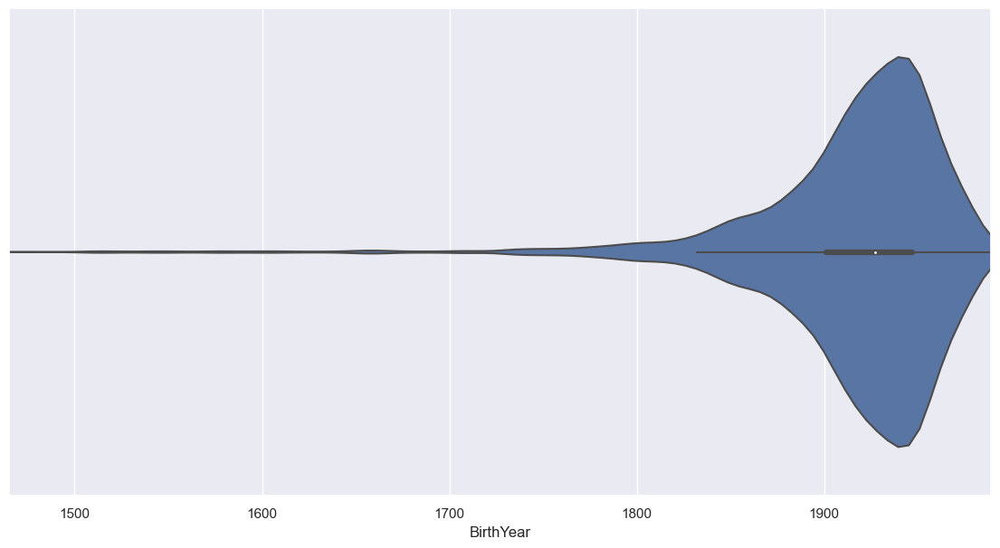

In [18]:
sns.set_theme(style="whitegrid")

sns.set(rc={"figure.figsize":(14, 7)})



a = s[(s>1400) & (s<2000)]

lim_left=min(a)
lim_right=max(a)





ax = sns.violinplot(x=a)

### Noter que au delà des limites les valeurs sont coupées car postulées
ax.set_xlim(left=lim_left, right=lim_right)

In [19]:
bins=[1400, 1500, 1600, 1700, 1800, 1900, 2000]

In [20]:
df['periode'] = pd.cut(df['BirthYear'], bins=bins, right=False  )
df.periode = df.periode.apply( lambda x : str(x.left) + '_' + str(x.right))

In [21]:
df.head()

,subject_uri,subjectBirthDate,r_property,target,BirthYear,YBegin,YEnd,periode
0,Scipione_del_Ferro,1465-02-06,almaMater,Università_di_Bologna,1465,1482,1493,1400_1500
1,Michael_Stifel,1487,almaMater,University_of_Wittenberg,1487,1504,1515,1400_1500
2,Justus_Velsius,1510,almaMater,Old_University_of_Leuven,1510,1527,1538,1500_1600
3,Erasmus_Reinhold,1511-10-22,almaMater,University_of_Wittenberg,1511,1528,1539,1500_1600
4,Erasmus_Reinhold,1511-10-22,institution,University_of_Wittenberg,1511,1538,1575,1500_1600


In [22]:
df.groupby(by='periode').size()

periode
1400_1500       2
1500_1600      24
1600_1700      31
1700_1800     128
1800_1900    1241
1900_2000    4526
dtype: int64

In [23]:
ldf = df[['subject_uri', 'r_property', 'target',
       'YBegin', 'YEnd', 'BirthYear', 'periode']].sort_values(by='subject_uri').to_dict('records')

In [24]:
ldf[:2]

[{'subject_uri': "'Mamphono_Khaketla",
  'r_property': 'almaMater',
  'target': 'University_of_Wisconsin',
  'YBegin': 1977,
  'YEnd': 1988,
  'BirthYear': 1960,
  'periode': '1900_2000'},
 {'subject_uri': 'A._M._Mathai',
  'r_property': 'institution',
  'target': 'McGill_University',
  'YBegin': 1962,
  'YEnd': 1999,
  'BirthYear': 1935,
  'periode': '1900_2000'}]

In [120]:
l = []
for i in ldf:
    if i['periode'] == '1400_1500':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]

[('Michael_Stifel',
  'University_of_Wittenberg',
  {'relationship': 'almaMater', 'birth_year': 1487, 'periode': '1400_1500'}),
 ('Scipione_del_Ferro',
  'Università_di_Bologna',
  {'relationship': 'almaMater', 'birth_year': 1465, 'periode': '1400_1500'})]

In [121]:
POG=nx.Graph()

In [122]:
POG.add_edges_from(l)

In [123]:

POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)

(False, False, False, 4, 2, 0.3333333333333333)

In [124]:
l_org = list(organisations.index); len(l_org); l_org[:3]

['AT&T_Bell_Laboratories', 'AT&T_Labs', 'Aarhus_University']

In [125]:
list(POG.nodes.data())[:4]

[('Michael_Stifel', {}),
 ('University_of_Wittenberg', {}),
 ('Scipione_del_Ferro', {}),
 ('Università_di_Bologna', {})]

In [126]:
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]

[('Michael_Stifel', {'type': 'P'}),
 ('University_of_Wittenberg', {'type': 'O'}),
 ('Scipione_del_Ferro', {'type': 'P'})]

In [127]:
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]

[('Michael_Stifel', {'type': 'P'}),
 ('University_of_Wittenberg', {'type': 'O'}),
 ('Scipione_del_Ferro', {'type': 'P'})]

In [128]:
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])

In [129]:
nx.set_node_attributes(POG, degree)

In [130]:
print(list(POG.nodes.data())[:4])

[('Michael_Stifel', {'type': 'P', 'degree': 1}), ('University_of_Wittenberg', {'type': 'O', 'degree': 1}), ('Scipione_del_Ferro', {'type': 'P', 'degree': 1}), ('Università_di_Bologna', {'type': 'O', 'degree': 1})]


In [131]:
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])

In [132]:
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]

[['Michael_Stifel', 1], ['Scipione_del_Ferro', 1]]

In [133]:
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])

In [134]:
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]

[['University_of_Wittenberg', 1], ['Università_di_Bologna', 1]]

In [135]:
edges = list(POG.edges.data())
edges[:5]

[('Michael_Stifel',
  'University_of_Wittenberg',
  {'relationship': 'almaMater', 'birth_year': 1487, 'periode': '1400_1500'}),
 ('Scipione_del_Ferro',
  'Università_di_Bologna',
  {'relationship': 'almaMater', 'birth_year': 1465, 'periode': '1400_1500'})]

In [136]:
labels = {}    
for node in POG.nodes():
    labels[node] = node

In [137]:
nx.set_node_attributes(POG, labels, 'label')

In [138]:
nodes = list(POG.nodes.data())
nodes[:5]

[('Michael_Stifel', {'type': 'P', 'degree': 1, 'label': 'Michael_Stifel'}),
 ('University_of_Wittenberg',
  {'type': 'O', 'degree': 1, 'label': 'University_of_Wittenberg'}),
 ('Scipione_del_Ferro',
  {'type': 'P', 'degree': 1, 'label': 'Scipione_del_Ferro'}),
 ('Università_di_Bologna',
  {'type': 'O', 'degree': 1, 'label': 'Università_di_Bologna'})]

In [139]:
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]

(2, [2, 2])

In [140]:
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]

In [141]:
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]

[[0, 2], [1, 2]]

In [142]:
li=[n[0] for n in ln]

In [143]:
S[1].nodes 

NodeView(('Scipione_del_Ferro', 'Università_di_Bologna'))

In [144]:
u = S[1]

In [145]:
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    

networkx.classes.graph.Graph

In [146]:
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

(False, False, 4, 2, 0.3333333333333333)

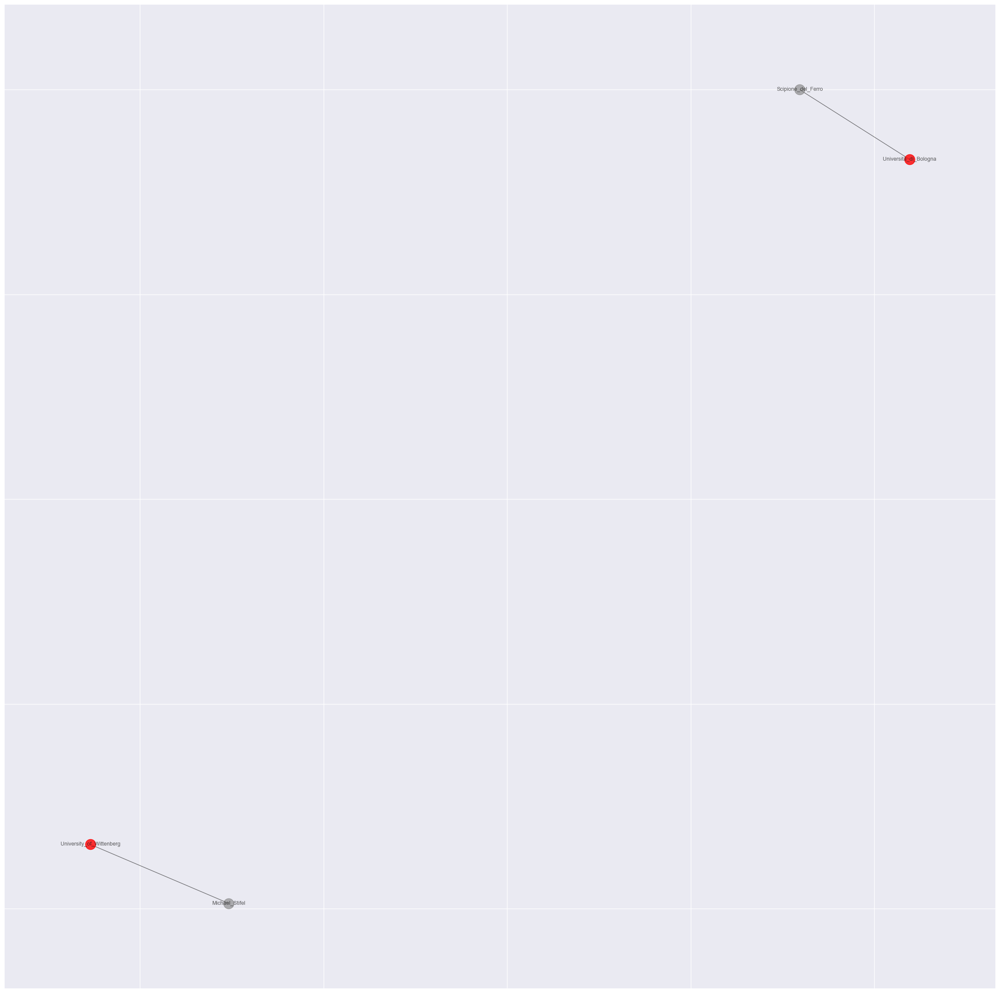

In [147]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [148]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [149]:
nt.prep_notebook()
nt.show('nx.html' )

In [150]:
l = []
for i in ldf:
    if i['periode'] == '1500_1600':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]
POG=nx.Graph()
POG.add_edges_from(l)
POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)
l_org = list(organisations.index); len(l_org); l_org[:3]
list(POG.nodes.data())[:4]
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])
nx.set_node_attributes(POG, degree)
print(list(POG.nodes.data())[:4])
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]
edges = list(POG.edges.data())
edges[:5]
labels = {}    
for node in POG.nodes():
    labels[node] = node
nx.set_node_attributes(POG, labels, 'label')
nodes = list(POG.nodes.data())
nodes[:5]
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]
li=[n[0] for n in ln]
S[1].nodes 
u = S[1]
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

[('Adriaan_Metius', {'type': 'P', 'degree': 1}), ('University_of_Franeker', {'type': 'O', 'degree': 1}), ('Benedetto_Castelli', {'type': 'P', 'degree': 2}), ('University_of_Pisa', {'type': 'O', 'degree': 2})]


(False, False, 17, 12, 0.08823529411764706)

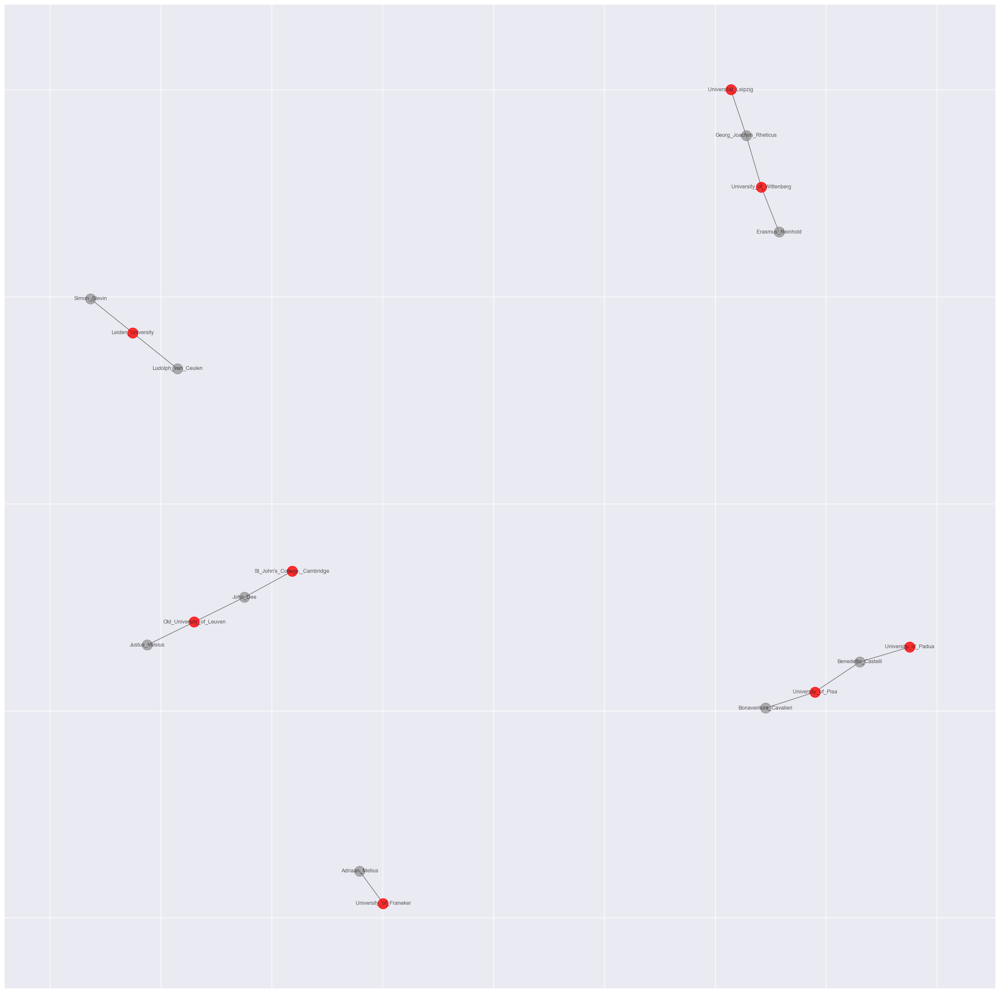

In [151]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [152]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)
nt.prep_notebook()
nt.show('nx.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [153]:
l = []
for i in ldf:
    if i['periode'] == '1600_1700':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]
POG=nx.Graph()
POG.add_edges_from(l)
POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)
l_org = list(organisations.index); len(l_org); l_org[:3]
list(POG.nodes.data())[:4]
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])
nx.set_node_attributes(POG, degree)
print(list(POG.nodes.data())[:4])
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]
edges = list(POG.edges.data())
edges[:5]
labels = {}    
for node in POG.nodes():
    labels[node] = node
nx.set_node_attributes(POG, labels, 'label')
nodes = list(POG.nodes.data())
nodes[:5]
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]
li=[n[0] for n in ln]
S[1].nodes 
u = S[1]
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

[('Abraham_de_Moivre', {'type': 'P', 'degree': 1}), ('Academy_of_Saumur', {'type': 'O', 'degree': 1}), ('Brook_Taylor', {'type': 'P', 'degree': 1}), ("St_John's_College,_Cambridge", {'type': 'O', 'degree': 1})]


(False, False, 22, 17, 0.0735930735930736)

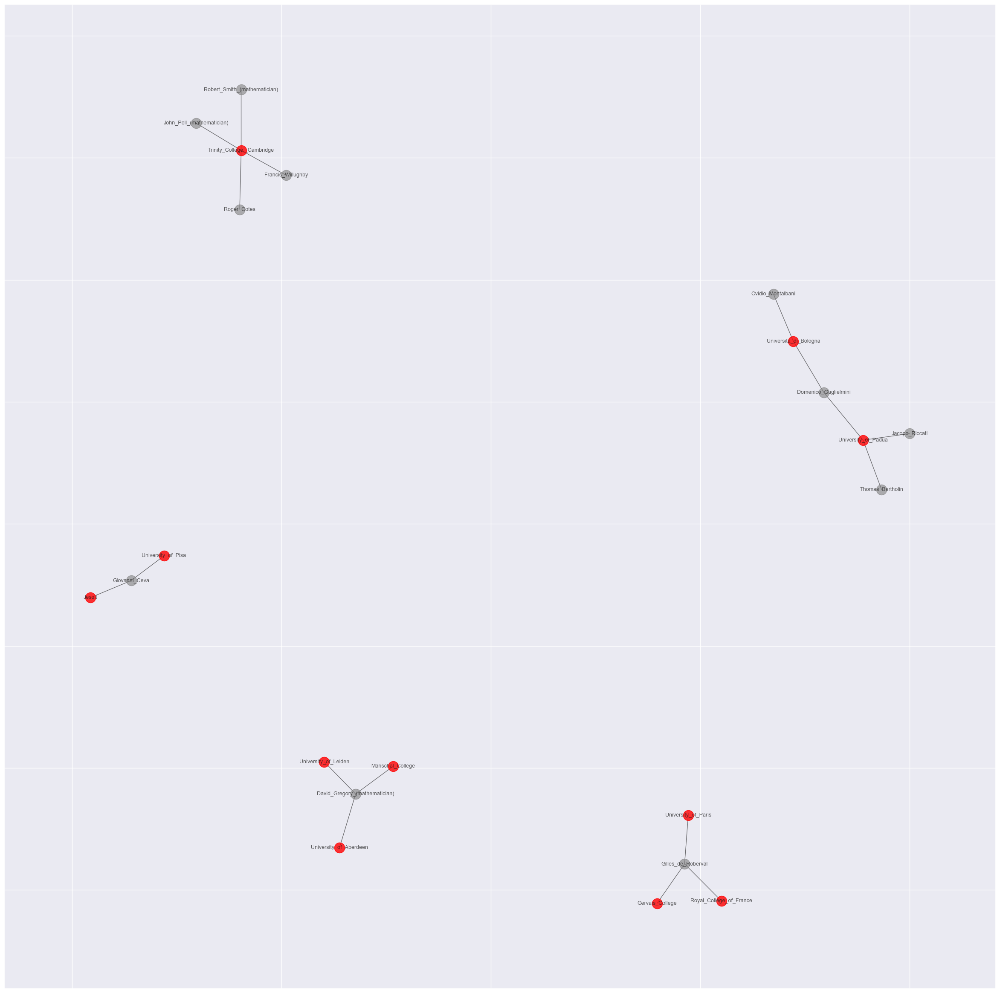

In [154]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [155]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)
nt.prep_notebook()
nt.show('nx.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [113]:
l = []
for i in ldf:
    if i['periode'] == '1700_1800':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]

[('Adolphe_Quetelet',
  'University_of_Ghent',
  {'relationship': 'almaMater', 'birth_year': 1796, 'periode': '1700_1800'}),
 ('Adrien-Marie_Legendre',
  'Collège_Mazarin',
  {'relationship': 'almaMater', 'birth_year': 1752, 'periode': '1700_1800'}),
 ('Anders_Johan_Lexell',
  'Russian_Academy_of_Sciences',
  {'relationship': 'institution', 'birth_year': 1740, 'periode': '1700_1800'}),
 ('Anders_Johan_Lexell',
  'The_Royal_Academy_of_Turku',
  {'relationship': 'almaMater', 'birth_year': 1740, 'periode': '1700_1800'}),
 ('Andreas_von_Ettingshausen',
  'Vienna_University_of_Technology',
  {'relationship': 'institution', 'birth_year': 1796, 'periode': '1700_1800'})]

In [114]:
POG=nx.Graph()
POG.add_edges_from(l)
POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)
l_org = list(organisations.index); len(l_org); l_org[:3]
list(POG.nodes.data())[:4]
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])
nx.set_node_attributes(POG, degree)
print(list(POG.nodes.data())[:4])
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]
edges = list(POG.edges.data())
edges[:5]
labels = {}    
for node in POG.nodes():
    labels[node] = node
nx.set_node_attributes(POG, labels, 'label')
nodes = list(POG.nodes.data())
nodes[:5]
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]
li=[n[0] for n in ln]
S[1].nodes 
u = S[1]
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

[('Adolphe_Quetelet', {'type': 'P', 'degree': 1}), ('University_of_Ghent', {'type': 'O', 'degree': 1}), ('Adrien-Marie_Legendre', {'type': 'P', 'degree': 1}), ('Collège_Mazarin', {'type': 'O', 'degree': 1})]


(False, False, 55, 52, 0.035016835016835016)

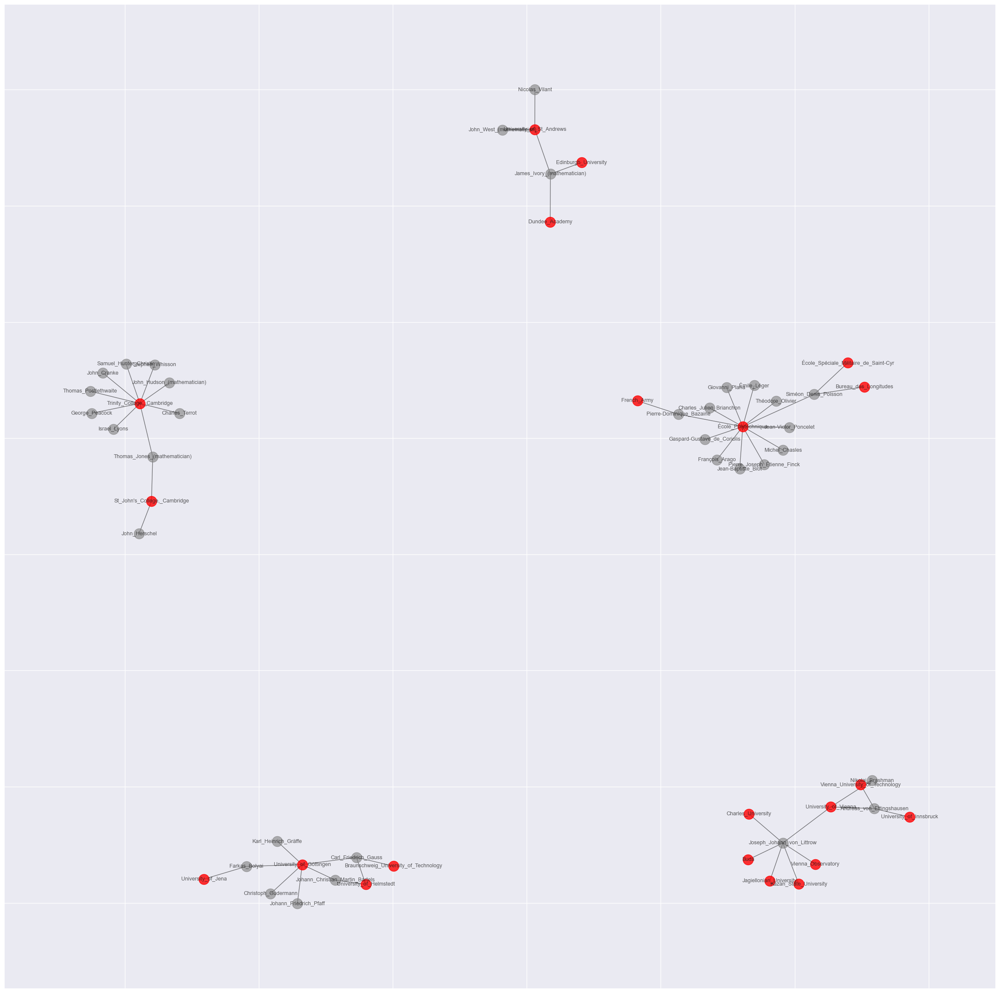

In [115]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [116]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)
nt.prep_notebook()
nt.show('nx.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [157]:
l = []
for i in ldf:
    if i['periode'] == '1800_1900':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]

[('Abraham_Fraenkel',
  'Hebrew_University_of_Jerusalem',
  {'relationship': 'institution', 'birth_year': 1891, 'periode': '1800_1900'}),
 ('Abraham_Fraenkel',
  'University_of_Marburg',
  {'relationship': 'almaMater', 'birth_year': 1891, 'periode': '1800_1900'}),
 ('Adolf_Hurwitz',
  'Universität_Leipzig',
  {'relationship': 'almaMater', 'birth_year': 1859, 'periode': '1800_1900'}),
 ('Adolf_Kneser',
  'University_of_Berlin',
  {'relationship': 'almaMater', 'birth_year': 1862, 'periode': '1800_1900'}),
 ('Adolf_Kneser',
  'University_of_Breslau',
  {'relationship': 'institution', 'birth_year': 1862, 'periode': '1800_1900'})]

In [158]:
POG=nx.Graph()
POG.add_edges_from(l)
POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)
l_org = list(organisations.index); len(l_org); l_org[:3]
list(POG.nodes.data())[:4]
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])
nx.set_node_attributes(POG, degree)
print(list(POG.nodes.data())[:4])
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]
edges = list(POG.edges.data())
edges[:5]
labels = {}    
for node in POG.nodes():
    labels[node] = node
nx.set_node_attributes(POG, labels, 'label')
nodes = list(POG.nodes.data())
nodes[:5]
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]
li=[n[0] for n in ln]
S[1].nodes 
u = S[1]
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

[('Abraham_Fraenkel', {'type': 'P', 'degree': 2}), ('Hebrew_University_of_Jerusalem', {'type': 'O', 'degree': 2}), ('University_of_Marburg', {'type': 'O', 'degree': 4}), ('Adolf_Hurwitz', {'type': 'P', 'degree': 1})]


(False, False, 842, 1007, 0.0028441426759795627)

In [117]:
l = []
for i in ldf:
    if i['periode'] == '1900_2000':
        l.append(tuple((i['subject_uri'],i['target'], 
                        {'relationship': i['r_property'], "birth_year": i['BirthYear'], "periode": i['periode'] })))
l[:5]
POG=nx.Graph()
POG.add_edges_from(l)
POG.is_multigraph(), POG.is_directed(), nx.is_connected(POG), POG.number_of_nodes(), POG.number_of_edges(), nx.density(POG)
l_org = list(organisations.index); len(l_org); l_org[:3]
list(POG.nodes.data())[:4]
types = {}
for e in list(POG.nodes):
    if e in l_org:
        t = 'O'
    else:
        t = 'P'
    types[e] = {'type': t} 
[(k,v )for k,v in types.items()][:3]
nx.set_node_attributes(POG, types)
list(POG.nodes.data())[:3]
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(POG)])
nx.set_node_attributes(POG, degree)
print(list(POG.nodes.data())[:4])
persons_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'P':
        persons_degree.append([n[0], n[1]['degree']])
sorted(persons_degree, key = lambda x : x[1], reverse=True)[:10]
org_degree = []
for n in list(POG.nodes.data()):
    if n[1]['type'] == 'O':
        org_degree.append([n[0], n[1]['degree']])
sorted(org_degree, key = lambda x : x[1], reverse=True)[:10]
edges = list(POG.edges.data())
edges[:5]
labels = {}    
for node in POG.nodes():
    labels[node] = node
nx.set_node_attributes(POG, labels, 'label')
nodes = list(POG.nodes.data())
nodes[:5]
components = nx.connected_components(POG);
components_l = [len(c) for c in sorted(nx.connected_components(POG), key=len, reverse=True)]
len(components_l), components_l[:5]
S = [POG.subgraph(c).copy() for c in nx.connected_components(POG)]
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]
li=[n[0] for n in ln]
S[1].nodes 
u = S[1]
u = nx.Graph()
for i in li[:5]:
    u = nx.union(u, S[i])
type(u)    
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

[("'Mamphono_Khaketla", {'type': 'P', 'degree': 1}), ('University_of_Wisconsin', {'type': 'O', 'degree': 2}), ('A._M._Mathai', {'type': 'P', 'degree': 2}), ('McGill_University', {'type': 'O', 'degree': 11})]


(False, False, 2676, 4076, 0.0011388178757526228)

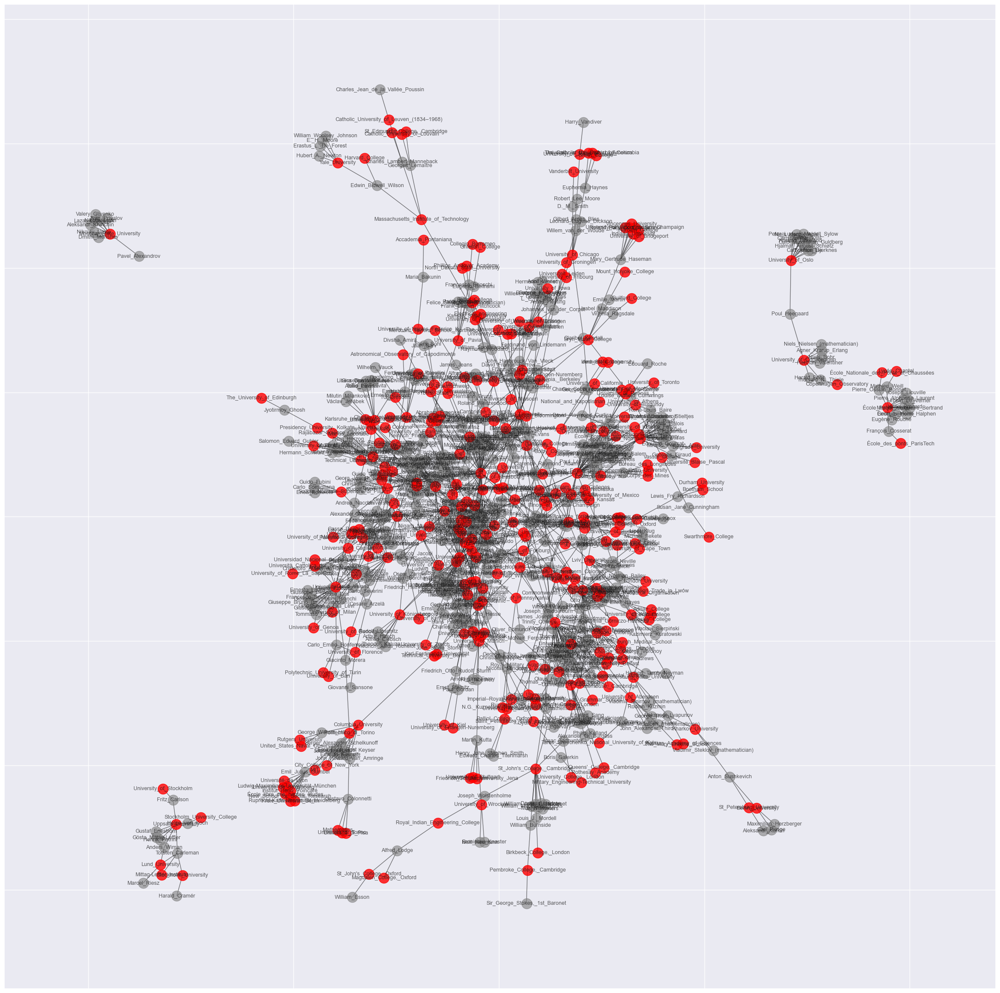

In [159]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [160]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)
nt.prep_notebook()
nt.show('nx.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


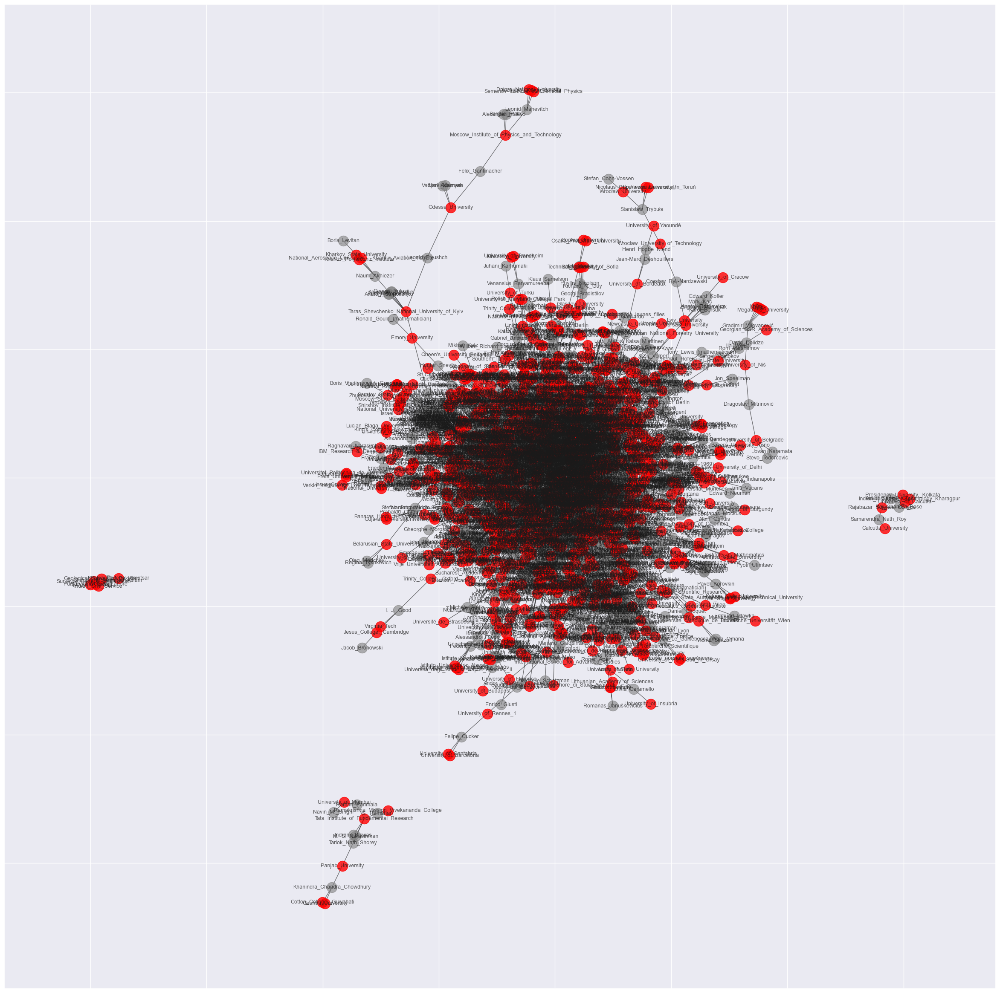

In [118]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
pos = nx.spring_layout(g)

no = [x for x,y in g.nodes(data=True) if y['type']=='O']
np = [x for x,y in g.nodes(data=True) if y['type']=='P'] 

co = 'red'
cp = 'grey'
nx.draw_networkx_nodes(g, pos, nodelist=np, node_color=cp, alpha=0.6)
nx.draw_networkx_nodes(g, pos, nodelist=no, node_color=co, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=9)


plt.show()

In [119]:
nt = Network( notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(g)
nt.prep_notebook()
nt.show('nx.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [55]:
pairs_p = []

for s1 in ldf:
    for s2 in ldf:
        if s1['subject_uri'] < s2['subject_uri'] \
            and s1['target'] == s2['target'] \
            and s2['YEnd'] > s1['YBegin'] \
            and s2['YBegin'] < s1['YEnd']:
            pairs_p.append([s1,s2])
        else:
            pass

In [56]:
len(pairs_p)

34937

In [57]:
pairs_p[:2]

[[{'subject_uri': "'Mamphono_Khaketla",
   'r_property': 'almaMater',
   'target': 'University_of_Wisconsin',
   'YBegin': 1977,
   'YEnd': 1988,
   'BirthYear': 1960,
   'periode': '1900_2000'},
  {'subject_uri': 'Marvin_Knopp',
   'r_property': 'institution',
   'target': 'University_of_Wisconsin',
   'YBegin': 1960,
   'YEnd': 1997,
   'BirthYear': 1933,
   'periode': '1900_2000'}],
 [{'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'},
  {'subject_uri': 'Carl_S._Herz',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1957,
   'YEnd': 1994,
   'BirthYear': 1930,
   'periode': '1900_2000'}]]

In [58]:
pairs_o = []

for s1 in ldf:
    for s2 in ldf:
        if s1['target'] < s2['target'] \
            and s1['subject_uri'] == s2['subject_uri']:
                pairs_o.append([s1,s2])
        else:
            pass

In [59]:
len(pairs_o)

6826

In [60]:
pairs_o[:2]

[[{'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'},
  {'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'Palai',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'}],
 [{'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'},
  {'subject_uri': 'A._M._Mathai',
   'r_property': 'almaMater',
   'target': 'Palai',
   'YBegin': 1952,
   'YEnd': 1963,
   'BirthYear': 1935,
   'periode': '1900_2000'}]]

In [61]:
earlyModern_pairs = [p for p in pairs_p if ((p[0]['periode']=='1700_1800') & (p[1]['periode']=='1700_1800'))]

In [62]:
len(earlyModern_pairs), earlyModern_pairs[:3]

(103,
 [[{'subject_uri': 'Andreas_von_Ettingshausen',
    'r_property': 'institution',
    'target': 'Vienna_University_of_Technology',
    'YBegin': 1823,
    'YEnd': 1860,
    'BirthYear': 1796,
    'periode': '1700_1800'},
   {'subject_uri': 'Nikolai_Brashman',
    'r_property': 'almaMater',
    'target': 'Vienna_University_of_Technology',
    'YBegin': 1813,
    'YEnd': 1824,
    'BirthYear': 1796,
    'periode': '1700_1800'}],
  [{'subject_uri': 'Andreas_von_Ettingshausen',
    'r_property': 'institution',
    'target': 'University_of_Vienna',
    'YBegin': 1823,
    'YEnd': 1860,
    'BirthYear': 1796,
    'periode': '1700_1800'},
   {'subject_uri': 'Joseph_Johann_von_Littrow',
    'r_property': 'institution',
    'target': 'University_of_Vienna',
    'YBegin': 1808,
    'YEnd': 1845,
    'BirthYear': 1781,
    'periode': '1700_1800'}],
  [{'subject_uri': 'Andreas_von_Ettingshausen',
    'r_property': 'institution',
    'target': 'University_of_Vienna',
    'YBegin': 1823,
    'Y

In [63]:
almaMater_pairs = [p for p in pairs_p if ((p[0]['r_property'] == 'almaMater') & (p[1]['r_property'] == 'almaMater'))]

In [64]:
len(almaMater_pairs), almaMater_pairs[:2]

(10169,
 [[{'subject_uri': 'A._O._L._Atkin',
    'r_property': 'almaMater',
    'target': 'University_of_Cambridge',
    'YBegin': 1942,
    'YEnd': 1953,
    'BirthYear': 1925,
    'periode': '1900_2000'},
   {'subject_uri': 'Anthony_James_Merrill_Spencer',
    'r_property': 'almaMater',
    'target': 'University_of_Cambridge',
    'YBegin': 1946,
    'YEnd': 1957,
    'BirthYear': 1929,
    'periode': '1900_2000'}],
  [{'subject_uri': 'A._O._L._Atkin',
    'r_property': 'almaMater',
    'target': 'University_of_Cambridge',
    'YBegin': 1942,
    'YEnd': 1953,
    'BirthYear': 1925,
    'periode': '1900_2000'},
   {'subject_uri': 'Brooke_Benjamin',
    'r_property': 'almaMater',
    'target': 'University_of_Cambridge',
    'YBegin': 1946,
    'YEnd': 1957,
    'BirthYear': 1929,
    'periode': '1900_2000'}]])

In [65]:
l = []
for i in earlyModern_pairs: #almaMater_pairs:
    l.append(tuple((i[0]['subject_uri'],i[1]['subject_uri'], {'relationship': f"{i[0]['r_property']}_{i[1]['r_property']}", 
                                                              'organisation': i[0]['target'] })))
l[:5]

[('Andreas_von_Ettingshausen',
  'Nikolai_Brashman',
  {'relationship': 'institution_almaMater',
   'organisation': 'Vienna_University_of_Technology'}),
 ('Andreas_von_Ettingshausen',
  'Joseph_Johann_von_Littrow',
  {'relationship': 'institution_institution',
   'organisation': 'University_of_Vienna'}),
 ('Andreas_von_Ettingshausen',
  'Nikolai_Brashman',
  {'relationship': 'institution_almaMater',
   'organisation': 'University_of_Vienna'}),
 ('Andreas_von_Ettingshausen',
  'Joseph_Johann_von_Littrow',
  {'relationship': 'almaMater_institution',
   'organisation': 'University_of_Vienna'}),
 ('Andreas_von_Ettingshausen',
  'Nikolai_Brashman',
  {'relationship': 'almaMater_almaMater',
   'organisation': 'University_of_Vienna'})]

In [66]:
EMP=nx.Graph()

In [67]:
EMP.add_edges_from(l)

In [68]:
EMP.is_multigraph(), EMP.is_directed(), nx.is_connected(EMP), EMP.number_of_nodes(), EMP.number_of_edges(), nx.density(EMP)

(False, False, False, 50, 90, 0.07346938775510205)

In [69]:
nodes = list(EMP.nodes.data())
nodes[:5]

[('Andreas_von_Ettingshausen', {}),
 ('Nikolai_Brashman', {}),
 ('Joseph_Johann_von_Littrow', {}),
 ('Antonio_Maria_Bordoni', {}),
 ('Gabrio_Piola', {})]

In [70]:
edges = list(EMP.edges.data())
edges[:5]

[('Andreas_von_Ettingshausen',
  'Nikolai_Brashman',
  {'relationship': 'almaMater_almaMater',
   'organisation': 'University_of_Vienna'}),
 ('Andreas_von_Ettingshausen',
  'Joseph_Johann_von_Littrow',
  {'relationship': 'almaMater_institution',
   'organisation': 'University_of_Vienna'}),
 ('Nikolai_Brashman',
  'Joseph_Johann_von_Littrow',
  {'relationship': 'institution_almaMater',
   'organisation': 'University_of_Vienna'}),
 ('Antonio_Maria_Bordoni',
  'Gabrio_Piola',
  {'relationship': 'almaMater_almaMater',
   'organisation': 'University_of_Pavia'}),
 ('Archibald_Alexander',
  'Joseph_Caldwell',
  {'relationship': 'almaMater_almaMater',
   'organisation': 'Princeton_University'})]

In [71]:
labels = {}    
for node in EMP.nodes():
    labels[node] = node

In [72]:
# https://pyvis.readthedocs.io/en/latest/tutorial.html#using-pyvis-within-jupyter-notebook
nt = Network(notebook=True) #, filter_menu=True)
# populates the nodes and edges data structures
nt.from_nx(EMP)
nt.prep_notebook()
nt.show('emp.html' )

Local cdn resources have problems on chrome/safari when used in jupyter-notebook. 


In [73]:
components = nx.connected_components(EMP);
components_l = [len(c) for c in sorted(nx.connected_components(EMP), key=len, reverse=True)]
len(components_l), components_l[:5]

(14, [12, 9, 6, 3, 2])

In [74]:
S = [EMP.subgraph(c).copy() for c in nx.connected_components(EMP)]

In [75]:
ln = sorted([[i,len(s.nodes)] for i,s in enumerate(S)], key = lambda row: row[1], reverse=True); ln[:8]

[[5, 12], [6, 9], [4, 6], [0, 3], [1, 2], [2, 2], [3, 2], [7, 2]]

In [76]:
li=[n[0] for n in ln]

In [77]:
u = nx.Graph()
for i in li[1:3]:
    u = nx.union(u, S[i])
type(u)    

networkx.classes.graph.Graph

In [78]:
u.is_multigraph(), u.is_directed(), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

(False, False, 15, 28, 0.26666666666666666)

In [79]:
u = S[5]

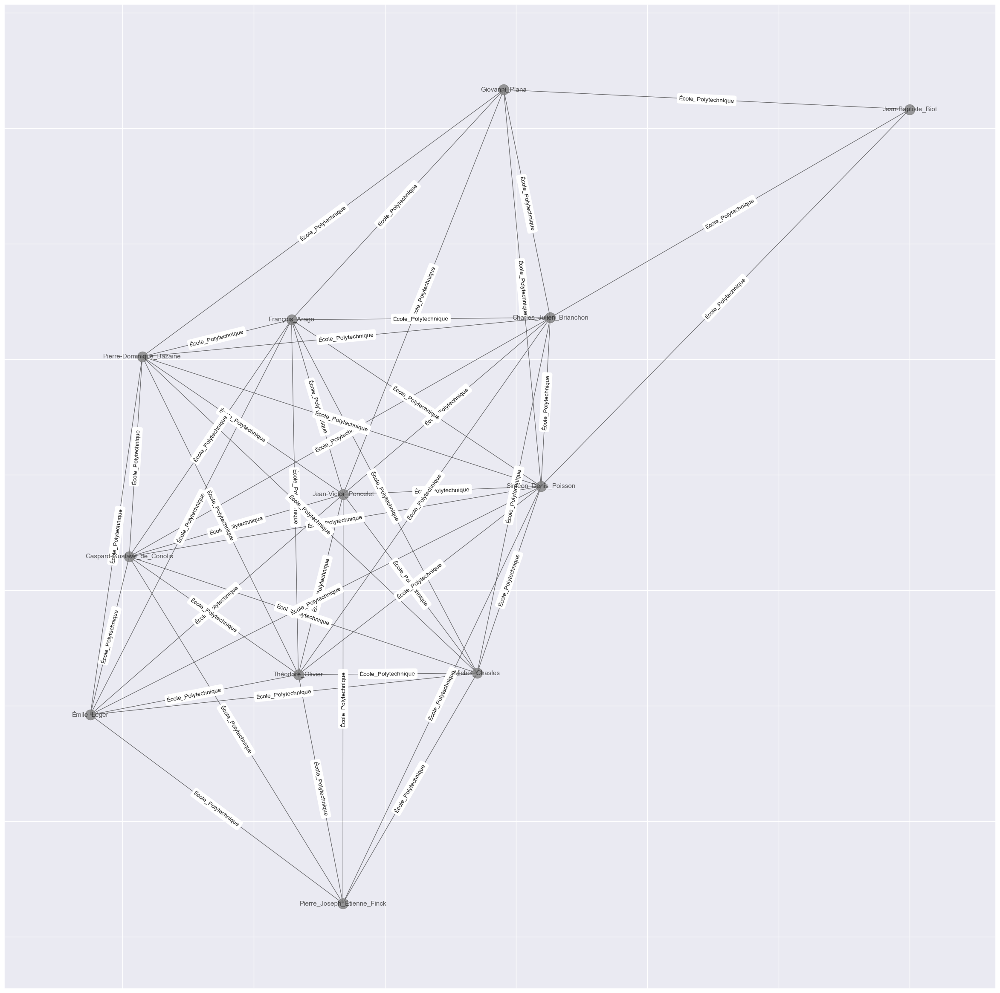

In [80]:
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
### https://networkx.org/documentation/stable/reference/generated/networkx.drawing.layout.spring_layout.html
pos = nx.spring_layout(g, k=1)

labels = {e: u.get_edge_data(e[0], e[1])["organisation"] for e in u.edges()}

cp = 'grey'
nx.draw_networkx_nodes(g, pos, node_color=cp, alpha=0.8)
nx.draw_networkx_edges(g, pos, alpha=0.6) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, alpha=0.7, font_size=11)
nx.draw_networkx_edge_labels(g, pos=pos, edge_labels=labels)



plt.show()

In [81]:
pairs_o[:2]

[[{'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'},
  {'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'Palai',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'}],
 [{'subject_uri': 'A._M._Mathai',
   'r_property': 'institution',
   'target': 'McGill_University',
   'YBegin': 1962,
   'YEnd': 1999,
   'BirthYear': 1935,
   'periode': '1900_2000'},
  {'subject_uri': 'A._M._Mathai',
   'r_property': 'almaMater',
   'target': 'Palai',
   'YBegin': 1952,
   'YEnd': 1963,
   'BirthYear': 1935,
   'periode': '1900_2000'}]]

In [82]:
l = []
for i in pairs_o:
    if i[0]['r_property'] == 'almaMater' or  i[1]['r_property'] == 'almaMater':
        l.append(tuple((i[0]['target'],i[1]['target'], {'relationship': f"{i[0]['r_property']}_{i[1]['r_property']}", 
                                                              'personne': i[0]['subject_uri'] })))
len(l), l[:3]        

(4298,
 [('McGill_University',
   'Palai',
   {'relationship': 'institution_almaMater', 'personne': 'A._M._Mathai'}),
  ('University_of_Cambridge',
   'University_of_Illinois_at_Chicago',
   {'relationship': 'almaMater_institution', 'personne': 'A._O._L._Atkin'}),
  ('Atlas_Computer_Laboratory',
   'University_of_Cambridge',
   {'relationship': 'institution_almaMater', 'personne': 'A._O._L._Atkin'})])

In [83]:
amO=nx.Graph()

In [84]:
amO.add_edges_from(l)

In [85]:
amO.is_multigraph(),nx.is_connected(amO) , amO.number_of_nodes(), amO.number_of_edges(), nx.density(amO)

(False, False, 1246, 3351, 0.00432033108356379)

In [86]:
nodes = list(amO.nodes.data())
nodes[:5]

[('McGill_University', {}),
 ('Palai', {}),
 ('University_of_Cambridge', {}),
 ('University_of_Illinois_at_Chicago', {}),
 ('Atlas_Computer_Laboratory', {})]

In [87]:
edges = list(amO.edges.data())
edges[:5]

[('McGill_University',
  'Palai',
  {'relationship': 'institution_almaMater', 'personne': 'A._M._Mathai'}),
 ('McGill_University',
  'Princeton_University',
  {'relationship': 'institution_almaMater', 'personne': 'Carl_S._Herz'}),
 ('McGill_University',
  'Cornell_University',
  {'relationship': 'almaMater_institution', 'personne': 'Carl_S._Herz'}),
 ('McGill_University',
  'Centre_de_Recherches_Mathématiques',
  {'relationship': 'institution_almaMater', 'personne': 'David_Sankoff'}),
 ('McGill_University',
  'University_of_Ottawa',
  {'relationship': 'almaMater_institution', 'personne': 'David_Sankoff'})]

In [88]:
components = nx.connected_components(amO);
components_l = [len(c) for c in sorted(nx.connected_components(amO), key=len, reverse=True)]
len(components_l), components_l[:5]

(30, [1158, 6, 6, 6, 6])

In [89]:
largest_cc = max(nx.connected_components(amO), key=len); type(largest_cc)

set

In [90]:
S = amO.subgraph(largest_cc).copy()
type(S)

networkx.classes.graph.Graph

In [91]:
S.is_multigraph(),nx.is_connected(S) , S.number_of_nodes(), S.number_of_edges(), nx.density(S)

(False, True, 1158, 3274, 0.0048872747248482245)

In [92]:
degree = dict([(d[0], {'degree': d[1]}) for d in nx.degree(S)])

In [93]:
nx.set_node_attributes(amO, degree)
print(list(amO.nodes.data())[:3])

[('McGill_University', {'degree': 18}), ('Palai', {'degree': 1}), ('University_of_Cambridge', {'degree': 140})]


In [94]:
closeness = nx.closeness_centrality(amO)

In [95]:
nx.set_node_attributes(amO, closeness, 'closeness')

In [96]:
betweenness = nx.betweenness_centrality(amO)

In [97]:
nx.set_node_attributes(amO, betweenness, 'betweenness')

In [98]:
export = pd.DataFrame(amO.nodes.data(), columns = ['id', 'attributes'])
#export = export.set_index('id')
export.head()

,id,attributes
0,McGill_University,"{'degree': 18, 'closeness': 0.314483790676012,..."
1,Palai,"{'degree': 1, 'closeness': 0.23502078258388748..."
2,University_of_Cambridge,"{'degree': 140, 'closeness': 0.400752918494701..."
3,University_of_Illinois_at_Chicago,"{'degree': 7, 'closeness': 0.317361298796129, ..."
4,Atlas_Computer_Laboratory,"{'degree': 1, 'closeness': 0.2800781662728015,..."


In [99]:
### Décomposer le champs attributs en colonnes
# https://stackoverflow.com/questions/38231591/split-explode-a-column-of-dictionaries-into-separate-columns-with-pandas

attributes = pd.json_normalize(export.attributes)

## Retour à affichage des décimales par défaut:
pd.options.display.float_format = '{: }'.format  # pour 4 chiffres : 4f


round(attributes, 4)

,degree,closeness,betweenness
0,18.0,0.3145,0.0127
1,1.0,0.235,0.0
2,140.0,0.4008,0.1338
3,7.0,0.3174,0.0007
4,1.0,0.2801,0.0
...,...,...,...
1241,12.0,0.2992,0.0
1242,12.0,0.2992,0.0
1243,12.0,0.2992,0.0
1244,1.0,0.2396,0.0


In [100]:
export = export.join(attributes)
export = export.drop(columns=['attributes'],axis=1)
export.head()

,id,degree,closeness,betweenness
0,McGill_University,18.0,0.314483790676012,0.012667938795499949
1,Palai,1.0,0.23502078258388748,0.0
2,University_of_Cambridge,140.0,0.40075291849470185,0.13379895167133782
3,University_of_Illinois_at_Chicago,7.0,0.317361298796129,0.000701104747150088
4,Atlas_Computer_Laboratory,1.0,0.2800781662728015,0.0


In [101]:
round(export.sort_values(by=['degree'], ascending=False),3)

,id,degree,closeness,betweenness
7,Princeton_University,144.0,0.424,0.127
2,University_of_Cambridge,140.0,0.401,0.134
8,Harvard_University,127.0,0.406,0.088
14,University_of_Chicago,104.0,0.392,0.071
26,"University_of_California,_Berkeley",92.0,0.386,0.057
...,...,...,...,...
1171,Institute_of_Statistical_Mathematics,NaN,0.001,0.0
1172,Kerala_University,NaN,0.002,0.0
1173,Madurai_Kamaraj_University,NaN,0.002,0.0
1174,Kothamangalam,NaN,0.002,0.0


In [102]:
export['degree'].describe()

count                1158.0
mean     5.6545768566493955
std      11.612507441439737
min                     1.0
25%                     1.0
50%                     2.0
75%                     5.0
max                   144.0
Name: degree, dtype: float64

(1.0, 144.0)

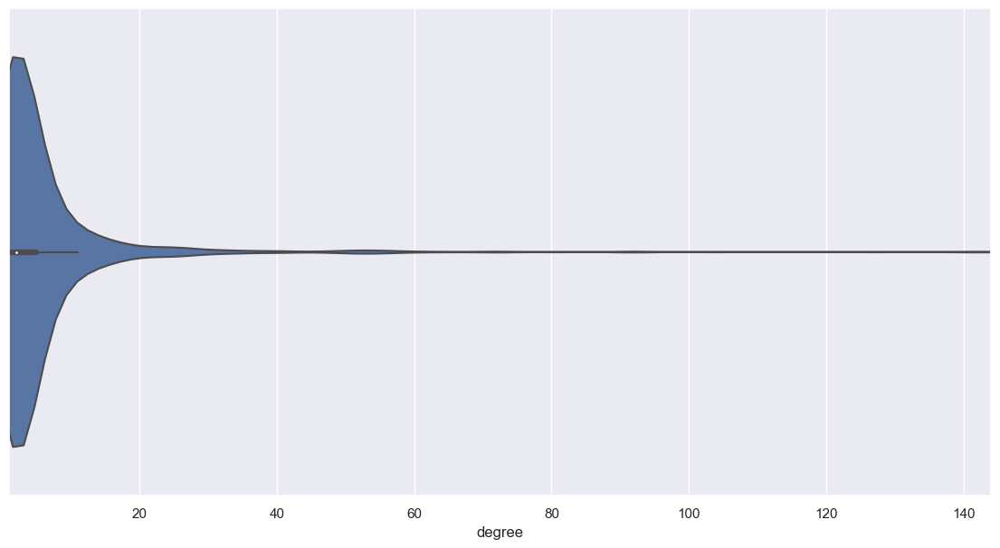

In [103]:
sns.set_theme(style="whitegrid")

sns.set(rc={"figure.figsize":(14, 7)})

a = export['degree'].dropna()
lim_left=min(a)
lim_right=max(a)





ax = sns.violinplot(x=a)

### Noter que au delà des limites les valeurs sont coupées car postulées
ax.set_xlim(left=lim_left, right=lim_right)

In [104]:
kamo = nx.k_core(amO, k=5)

In [105]:
kamo.is_multigraph(),nx.is_connected(kamo) , kamo.number_of_nodes(), kamo.number_of_edges(), nx.density(kamo)

(False, True, 216, 1456, 0.06270456503014643)

In [106]:
components = nx.connected_components(kamo);
components_l = [len(c) for c in sorted(nx.connected_components(kamo), key=len, reverse=True)]
len(components_l), components_l[:5]

(1, [216])

In [107]:
largest_cc = max(nx.connected_components(kamo), key=len)

In [108]:
S = kamo.subgraph(largest_cc).copy()
type(S)

networkx.classes.graph.Graph

In [109]:
### Principales caractéristiques de ce graphe

# MultiGraph: Undirected graphs with self loops and parallel edges
# https://networkx.org/documentation/stable/reference/classes/index.html
u = S
## ,nx.is_connected(G_1971_1975) u.is_directed(),
u.is_multigraph(), nx.is_connected(u), u.number_of_nodes(), u.number_of_edges(), nx.density(u)

(False, True, 216, 1456, 0.06270456503014643)

In [110]:
list(u.nodes.data())[1:3]

[('University_of_Southern_California',
  {'degree': 8,
   'closeness': 0.31522136626247,
   'betweenness': 0.0008799802289953998}),
 ('University_of_Pisa',
  {'degree': 13,
   'closeness': 0.27457101131799927,
   'betweenness': 0.004605879985480655})]

In [111]:
labels = {}
for i in list(u.nodes.data()):
    if i[1]['degree'] > 15:
        labels[i[0]]=i[0] 
list(labels.items())[:3]

[('University_of_Vienna', 'University_of_Vienna'),
 ('University_of_Pennsylvania', 'University_of_Pennsylvania'),
 ('Universität_Leipzig', 'Universität_Leipzig')]

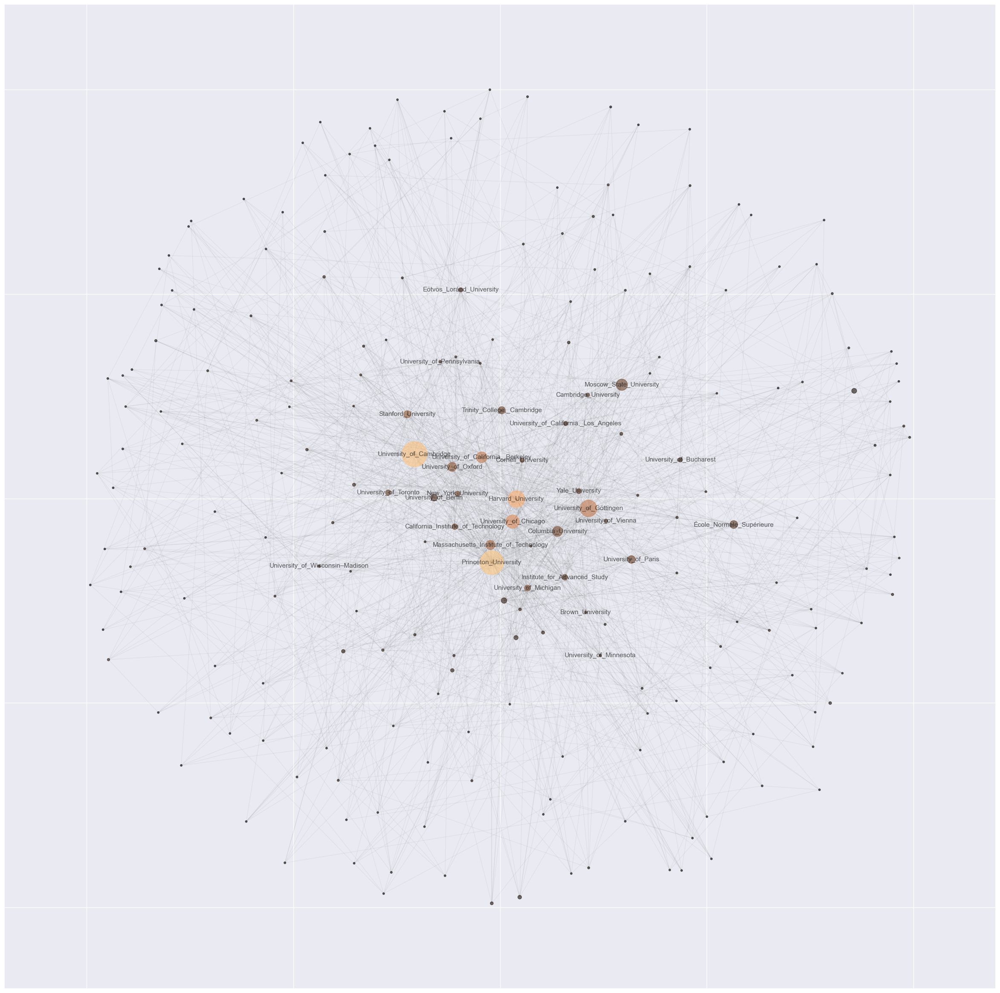

In [112]:
# https://networkx.org/documentation/stable/reference/drawing.html
plt.figure(figsize = (30,30))

#g = POG
g = u

#pos = nx.kamada_kawai_layout(g)
### https://networkx.org/documentation/stable/reference/generated/networkx.drawing.layout.spring_layout.html
pos = nx.spring_layout(g, k=1)

labels = {}
for i in list(u.nodes.data()):
    if i[1]['degree'] > 30:
        labels[i[0]]=i[0] 

node_color = [i[1]['degree'] for i in list(u.nodes.data())]

### Adapter la taille des attribut à l'affichage
node_sizes = [i[1]['betweenness']**2 * 100000 + 10 for i in list(u.nodes.data())]


cp = 'grey'
nx.draw_networkx_nodes(g, pos, node_size=node_sizes, node_color=node_color, 
                      cmap='copper', alpha=0.6)
nx.draw_networkx_edges(g, pos, alpha=0.05) # edgelist=ln, edge_color=c, 
nx.draw_networkx_labels(g, pos, labels=labels,  alpha=0.7, font_size=11)
#nx.draw_networkx_edge_labels(g, pos=pos, edge_labels=labels)

f = '/Users/maxime/Documents/dossier_python/picture/universites.svg'# io.BytesIO()

plt.savefig(f, format="svg")

plt.show()